#### EDA y Preprocesamiento <br>
- Vamos a trabajar con el dataset de Lluvia en Australia

In [64]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns
sns.set()

from sklearn.preprocessing import StandardScaler

from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_validate

from sklearn.tree import DecisionTreeClassifier

import sklearn.metrics as metrics
from sklearn.model_selection import learning_curve

In [65]:
data = pd.read_csv('weatherAUS.csv')

In [66]:
data.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


#### Contamos cuantos valores no nulos hay

In [67]:
data.count().sort_values()

Sunshine          75625
Evaporation       82670
Cloud3pm          86102
Cloud9am          89572
Pressure9am      130395
Pressure3pm      130432
WindDir9am       134894
WindGustDir      135134
WindGustSpeed    135197
Humidity3pm      140953
WindDir3pm       141232
Temp3pm          141851
RainTomorrow     142193
RainToday        142199
Rainfall         142199
WindSpeed3pm     142398
Humidity9am      142806
Temp9am          143693
WindSpeed9am     143693
MinTemp          143975
MaxTemp          144199
Location         145460
Date             145460
dtype: int64

#### Eliminamos columnas que no nos interesan, entre ellas las que tienen pocos datos (menos de cien mil). Además, tirar 'Location' y 'Date', ya que no nos interesa el lugar ni fecha (al menos en este análisis), y 'RISK_MM'

In [68]:
columnas_descartables = ['Sunshine','Evaporation','Cloud3pm','Cloud9am','Location','Date']
data.drop(columns=columnas_descartables)
data.shape

(145460, 23)

#### Eliminamos Todas las filas con valores nulos

In [69]:
data = data.dropna()
print(data.shape)
data.head()

(56420, 23)


,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
6049,2009-01-01,Cobar,17.9,35.2,0.0,12.0,12.3,SSW,48.0,ENE,...,20.0,13.0,1006.3,1004.4,2.0,5.0,26.6,33.4,No,No
6050,2009-01-02,Cobar,18.4,28.9,0.0,14.8,13.0,S,37.0,SSE,...,30.0,8.0,1012.9,1012.1,1.0,1.0,20.3,27.0,No,No
6052,2009-01-04,Cobar,19.4,37.6,0.0,10.8,10.6,NNE,46.0,NNE,...,42.0,22.0,1012.3,1009.2,1.0,6.0,28.7,34.9,No,No
6053,2009-01-05,Cobar,21.9,38.4,0.0,11.4,12.2,WNW,31.0,WNW,...,37.0,22.0,1012.7,1009.1,1.0,5.0,29.1,35.6,No,No
6054,2009-01-06,Cobar,24.2,41.0,0.0,11.2,8.4,WNW,35.0,NW,...,19.0,15.0,1010.7,1007.4,1.0,6.0,33.6,37.6,No,No


####  Para simplificar el preprocesamiento, también Eliminar todas las columnas que tengan valores categóricos.

In [70]:
columnas_descartables = ['WindGustDir','WindDir9am','WindDir3pm','RainToday']
data = data.drop(columns=columnas_descartables)
data.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainTomorrow
6049,2009-01-01,Cobar,17.9,35.2,0.0,12.0,12.3,48.0,6.0,20.0,20.0,13.0,1006.3,1004.4,2.0,5.0,26.6,33.4,No
6050,2009-01-02,Cobar,18.4,28.9,0.0,14.8,13.0,37.0,19.0,19.0,30.0,8.0,1012.9,1012.1,1.0,1.0,20.3,27.0,No
6052,2009-01-04,Cobar,19.4,37.6,0.0,10.8,10.6,46.0,30.0,15.0,42.0,22.0,1012.3,1009.2,1.0,6.0,28.7,34.9,No
6053,2009-01-05,Cobar,21.9,38.4,0.0,11.4,12.2,31.0,6.0,6.0,37.0,22.0,1012.7,1009.1,1.0,5.0,29.1,35.6,No
6054,2009-01-06,Cobar,24.2,41.0,0.0,11.2,8.4,35.0,17.0,13.0,19.0,15.0,1010.7,1007.4,1.0,6.0,33.6,37.6,No


#### Vemos cuantos dias hay de Lluvia y cuantos de No-Lluvia

In [71]:
data['RainTomorrow'].value_counts()

No     43993
Yes    12427
Name: RainTomorrow, dtype: int64

#### Hacemos Pairplot para ver Relaciones entre variable

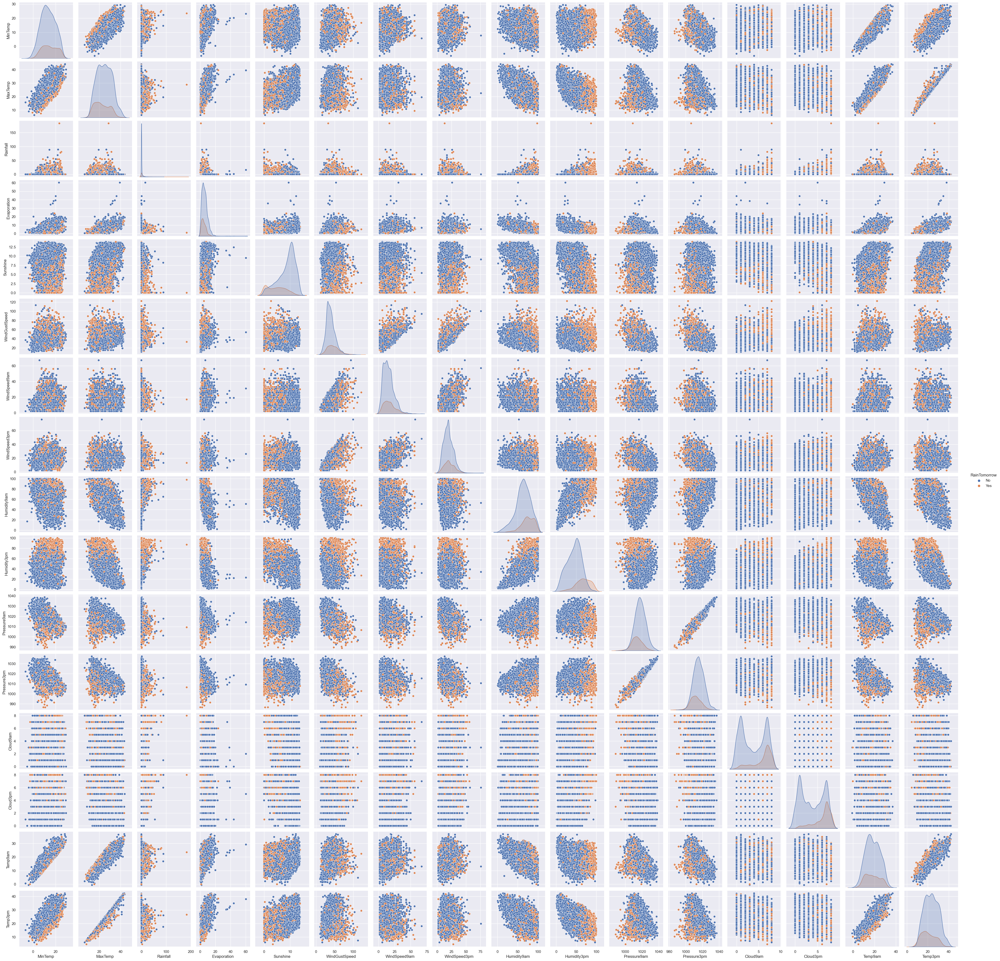

In [72]:
sns.pairplot(data.sample(frac = 0.1), hue = 'RainTomorrow')

C:\Users\Emanu\AppData\Local\Temp\ipykernel_10916\4009259066.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr = data.drop(columns = ['RainTomorrow']).corr(method='pearson') # .corr is used for find corelation


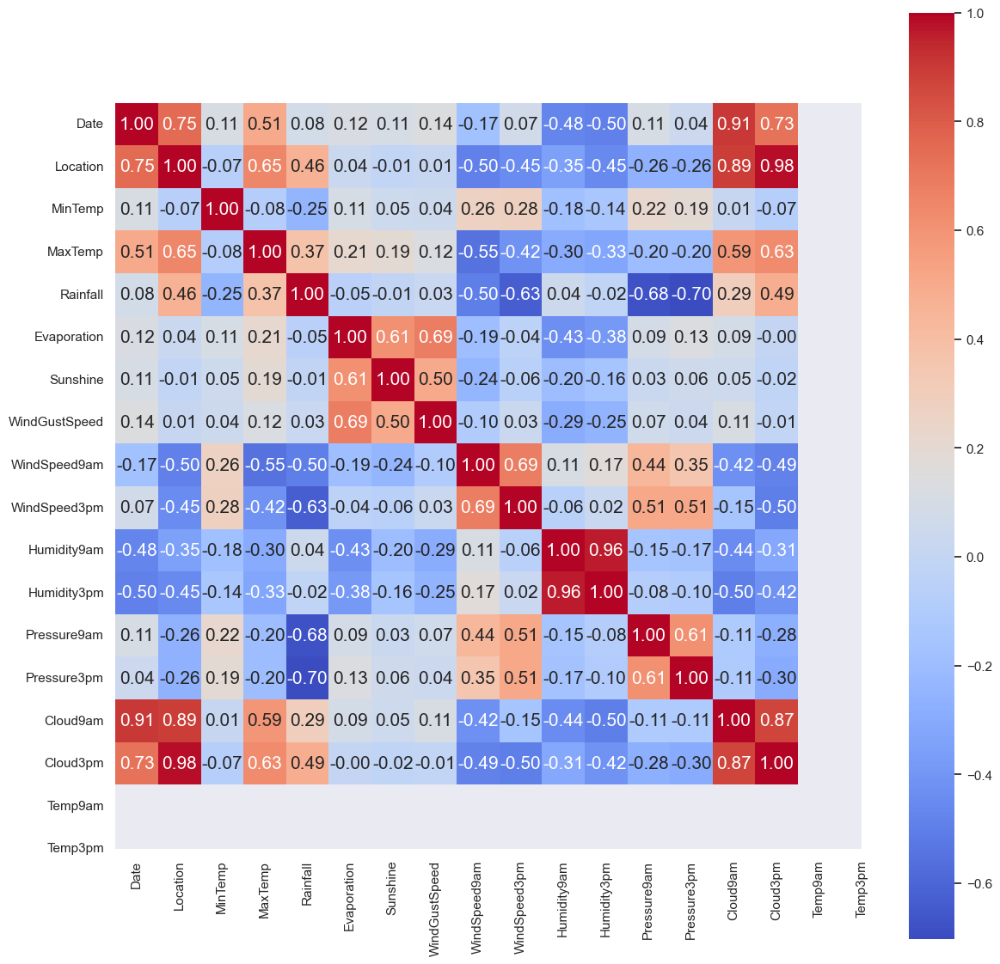

In [73]:
corr = data.drop(columns = ['RainTomorrow']).corr(method='pearson') # .corr is used for find corelation
plt.figure(figsize=(14,14))
sns.heatmap(corr, cbar = True,  square = True, annot=True, fmt= '.2f',annot_kws={'size': 15},
           xticklabels= data.drop(columns = ['RainTomorrow']).columns, 
           yticklabels= data.drop(columns = ['RainTomorrow']).columns,
           cmap= 'coolwarm')

plt.show()

##### En base a la correlación, podemos descartar (o no) algunas variables. 

In [74]:
data = data.drop(columns=['Temp3pm', 'Pressure9am'])

##### Llevamos `RainTomorrow` a una variable númerica

In [75]:
data['RainTomorrow_01'] = data['RainTomorrow'].map({'Yes':1,'No':0})
data.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,RainTomorrow,RainTomorrow_01
6049,2009-01-01,Cobar,17.9,35.2,0.0,12.0,12.3,48.0,6.0,20.0,20.0,13.0,1004.4,2.0,5.0,26.6,No,0
6050,2009-01-02,Cobar,18.4,28.9,0.0,14.8,13.0,37.0,19.0,19.0,30.0,8.0,1012.1,1.0,1.0,20.3,No,0
6052,2009-01-04,Cobar,19.4,37.6,0.0,10.8,10.6,46.0,30.0,15.0,42.0,22.0,1009.2,1.0,6.0,28.7,No,0
6053,2009-01-05,Cobar,21.9,38.4,0.0,11.4,12.2,31.0,6.0,6.0,37.0,22.0,1009.1,1.0,5.0,29.1,No,0
6054,2009-01-06,Cobar,24.2,41.0,0.0,11.2,8.4,35.0,17.0,13.0,19.0,15.0,1007.4,1.0,6.0,33.6,No,0


##### Datos de entrenamiento y casos *Benchmark*

In [76]:
columnas_entrenamiento = ['MaxTemp','Humidity3pm'] #'MinTemp', 'Rainfall'
X = data[columnas_entrenamiento]
# X = data.drop(columns = 'RainTomorrow')
y = data.RainTomorrow_01

##### Generamos un modelo que diga siempre que NO va a llover y medir su exactitud.

In [77]:
#Todos Ceros
y_pred = np.zeros(y.shape)
accuracy_ceros = metrics.accuracy_score(y,y_pred)
print(accuracy_ceros)

0.7797412265154201


##### Y generamos otro modelo que diga siempre que va a llover y medir su exactitud.

In [78]:
#Todos Unos
y_pred = np.ones(y.shape)
accuracy_unos = metrics.accuracy_score(y,y_pred)
print(accuracy_unos)

0.22025877348457992


### Bagging <br>
Separamos en Train y test

In [83]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=42, stratify= y)

##### El objetivo de bagging es entrenar distintos modelos, donde cada uno vea distintas porciones del set de entrenamiento. Entonces, vamos a entrenar distintos árboles de decisión y mostrarles distintas porciones del set de datos. <br> Crear una lista vacía donde guardaremos los modelos entrenados y elegir cuántos modelos entrenar (Empezar por algún valor entre 5 y 10).

In [84]:
lista_de_modelos = []
N_modelos = 10

In [85]:
for i in range(N_modelos):
    X_train_boostrap, _, y_train_boostrap, _ = train_test_split(X_train, y_train, test_size=0.5, stratify = y_train)
    clf = DecisionTreeClassifier(max_depth = None) #Notar que lo dejamos overfitear
    clf.fit(X_train_boostrap, y_train_boostrap)
    lista_de_modelos.append(clf)

##### Evaluamos el accuracy de cada modelo usando el conjunto de held_out

In [86]:
for idx, modelo in enumerate(lista_de_modelos):
    y_test_pred = modelo.predict(X_test)
    print('Accuracy Modelo ', idx, ' es ', metrics.accuracy_score(y_test, y_test_pred))

Accuracy Modelo  0  es  0.7743117097955807
Accuracy Modelo  1  es  0.7808105872622002
Accuracy Modelo  2  es  0.7798062152900863
Accuracy Modelo  3  es  0.7787427626137303
Accuracy Modelo  4  es  0.7808105872622002
Accuracy Modelo  5  es  0.7853598014888338
Accuracy Modelo  6  es  0.7770885028949545
Accuracy Modelo  7  es  0.7825239276852181
Accuracy Modelo  8  es  0.7818149592343141
Accuracy Modelo  9  es  0.7751979203592106


##### Evaluamos el accuracy de todo el ensamble usando el conjunto de held_out. Vamos a hacerlo usando un promedio de las probabilidades que devuelven cada árbol. Si la probabilidad promedio es mayor a 0.5

In [87]:
probs_test_pred = np.zeros(y_test.size)

#### Recorrer la lista de modelos y predecir las probabilidades. Mirar como es el `shape` de ese arreglo predicho. Elegir las probabilidades que correspondan a la clase positiva. Luego, sumarlas al vector que definieron antes.

In [88]:
for modelo in lista_de_modelos:
    probs_test_pred_modelo = modelo.predict_proba(X_test)
    print(probs_test_pred_modelo.shape)
    probs_test_pred +=probs_test_pred_modelo[:,1]

(16926, 2)
(16926, 2)
(16926, 2)
(16926, 2)
(16926, 2)
(16926, 2)
(16926, 2)
(16926, 2)
(16926, 2)
(16926, 2)


In [89]:
probs_test_pred.shape

(16926,)

##### Dividimos `probs_test_pred` por la cantidad de modelos

In [90]:
probs_test_pred = probs_test_pred/N_modelos
probs_test_pred

array([0.49166667, 0.35      , 0.        , ..., 0.8       , 1.        ,
       0.28333333])

##### Crear las clases predichas (0s y 1s) a partir de comparar la probabilidad predicha con la probabilidad umbral (0.5)

In [91]:
y_test_pred = probs_test_pred>0.5
y_test_pred = y_test_pred.astype(int)

##### Y evaluar la exactitud de todo el ensamble

In [92]:
print('Accuracy Ensamble ', metrics.accuracy_score(y_test, y_test_pred))

Accuracy Ensamble  0.7957580054354247


##### Explorar el `BagginnClassfier` de scikit-learn y algunas de sus características. Usarlo para predecir sobre el train y test, y medir su desempeño.

In [93]:
from sklearn.ensemble import BaggingClassifier

In [94]:
X_train

,MaxTemp,Humidity3pm
86288,23.4,90.0
118760,31.6,48.0
123726,24.2,58.0
36995,18.5,40.0
38826,8.0,87.0
...,...,...
122468,25.7,37.0
6240,18.4,42.0
35895,24.8,57.0
130505,16.6,46.0


In [95]:
clf = BaggingClassifier(base_estimator=DecisionTreeClassifier(max_depth = None), bootstrap_features=False, n_estimators= 200, n_jobs = -1)
clf.fit(X_train, y_train)
y_train_pred = clf.predict(X_train)
y_test_pred = clf.predict(X_test)
print(metrics.accuracy_score(y_train, y_train_pred))
print(metrics.accuracy_score(y_test, y_test_pred))

0.8842355800881146
0.794103745716649


In [96]:
clf = BaggingClassifier(base_estimator=DecisionTreeClassifier(max_depth = 2), bootstrap_features=False, n_estimators= 200, n_jobs = -1)
clf.fit(X_train, y_train)
y_train_pred = clf.predict(X_train)
y_test_pred = clf.predict(X_test)
print(metrics.accuracy_score(y_train, y_train_pred))
print(metrics.accuracy_score(y_test, y_test_pred))

0.8307844229503216
0.8288431998109418


In [97]:
X_test

,MaxTemp,Humidity3pm
22586,21.9,58.0
79744,23.4,54.0
13137,33.0,41.0
39093,23.2,20.0
102036,28.2,41.0
...,...,...
12170,26.2,58.0
66509,11.3,49.0
34187,26.3,59.0
93437,27.9,82.0


### Random Forest

In [101]:
from sklearn.ensemble import RandomForestClassifier

In [102]:
columnas_entrenamiento = ['MaxTemp','Humidity3pm','MinTemp', 'Rainfall']
X = data[columnas_entrenamiento]
# X = data.drop(columns = 'RainTomorrow')
y = data.RainTomorrow_01

In [103]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=42, stratify = y)

##### Investigamos sus parámetros. En particular, `n_estimators`, `max_features` y `oob_score`. Luego, creamos y entrenamos un modelo en el conjunto de train.

In [104]:
clf = RandomForestClassifier(n_estimators=200, max_features='sqrt', n_jobs=-1, oob_score = True, random_state = 42)
clf.fit(X_train,y_train)

RandomForestClassifier(n_estimators=200, n_jobs=-1, oob_score=True,
                       random_state=42)

##### Evaluamos Desempeño

In [105]:
y_train_pred = clf.predict(X_train)
y_test_pred = clf.predict(X_test)
print(metrics.accuracy_score(y_train, y_train_pred))
print(metrics.accuracy_score(y_test, y_test_pred))

0.999037828530916
0.8242349048800661


In [106]:
clf.oob_score_

0.8210867473540284

In [107]:
clf.feature_importances_

array([0.25486609, 0.34682615, 0.2584369 , 0.13987086])

In [109]:
clf.estimators_

[DecisionTreeClassifier(max_features='sqrt', random_state=1608637542),
 DecisionTreeClassifier(max_features='sqrt', random_state=1273642419),
 DecisionTreeClassifier(max_features='sqrt', random_state=1935803228),
 DecisionTreeClassifier(max_features='sqrt', random_state=787846414),
 DecisionTreeClassifier(max_features='sqrt', random_state=996406378),
 DecisionTreeClassifier(max_features='sqrt', random_state=1201263687),
 DecisionTreeClassifier(max_features='sqrt', random_state=423734972),
 DecisionTreeClassifier(max_features='sqrt', random_state=415968276),
 DecisionTreeClassifier(max_features='sqrt', random_state=670094950),
 DecisionTreeClassifier(max_features='sqrt', random_state=1914837113),
 DecisionTreeClassifier(max_features='sqrt', random_state=669991378),
 DecisionTreeClassifier(max_features='sqrt', random_state=429389014),
 DecisionTreeClassifier(max_features='sqrt', random_state=249467210),
 DecisionTreeClassifier(max_features='sqrt', random_state=1972458954),
 DecisionTreeC

##### Elegimos uno de los estimators y evaluamos el desempeño de train y test

In [110]:
clf_tree = clf.estimators_[50]
clf_tree.get_params()

{'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': 'sqrt',
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'random_state': 1224821422,
 'splitter': 'best'}

In [111]:
y_train_pred = clf_tree.predict(X_train)
y_test_pred = clf_tree.predict(X_test)
print(metrics.accuracy_score(y_train, y_train_pred))
print(metrics.accuracy_score(y_test, y_test_pred))

0.9088469134552084
0.7568238213399504


c:\Users\Emanu\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(
c:\Users\Emanu\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(


In [112]:
train_accuracy = []
test_accuracy = []
oob_scores = []

N_estimadores = [2,10,50,100,150]#,10,25,50,100,250,500,1000]
for estimadores in N_estimadores:
    print(estimadores)
    clf = RandomForestClassifier(n_estimators=estimadores, n_jobs=-1, oob_score= True, random_state = 42)
    clf.fit(X_train,y_train)
    
    y_train_pred = clf.predict(X_train)
    y_test_pred = clf.predict(X_test)
    
    train_accuracy.append(metrics.accuracy_score(y_train, y_train_pred))
    test_accuracy.append(metrics.accuracy_score(y_test, y_test_pred))
    oob_scores.append(clf.oob_score_)
    
train_accuracy = np.array(train_accuracy)
test_accuracy = np.array(test_accuracy)
oob_scores = np.array(oob_scores)

2


c:\Users\Emanu\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\ensemble\_forest.py:586: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable OOB estimates.
  warn(


10


c:\Users\Emanu\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\ensemble\_forest.py:586: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable OOB estimates.
  warn(


50
100
150


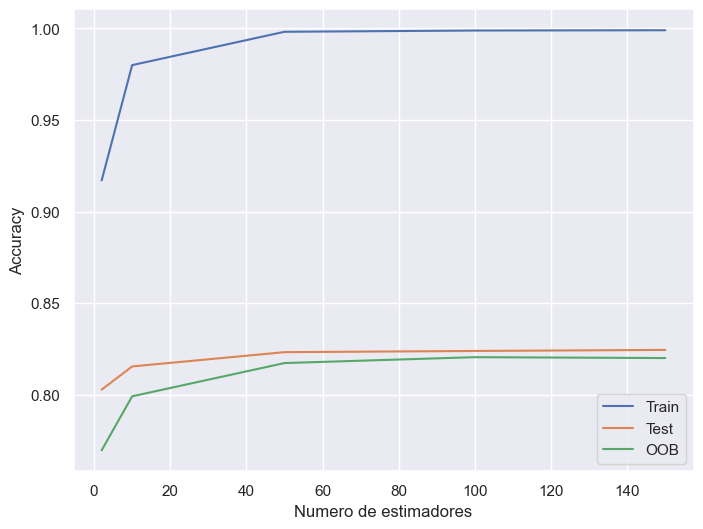

In [113]:
plt.figure(figsize = (8,6))
plt.plot(N_estimadores, train_accuracy, label = 'Train')
plt.plot(N_estimadores, test_accuracy, label = 'Test')
plt.plot(N_estimadores, oob_scores, label = 'OOB')
plt.xlabel('Numero de estimadores')
plt.ylabel('Accuracy')
plt.legend()
# plt.xlim(0,50)
plt.show()

In [114]:
clf = RandomForestClassifier(n_estimators=250, n_jobs=-1, oob_score= True, random_state = 42)

train_sizes, train_scores, valid_scores = learning_curve(clf, X_train, y_train, 
                                                         train_sizes = np.linspace(0.0001,1,10),
                                                         scoring = 'accuracy', cv=5)

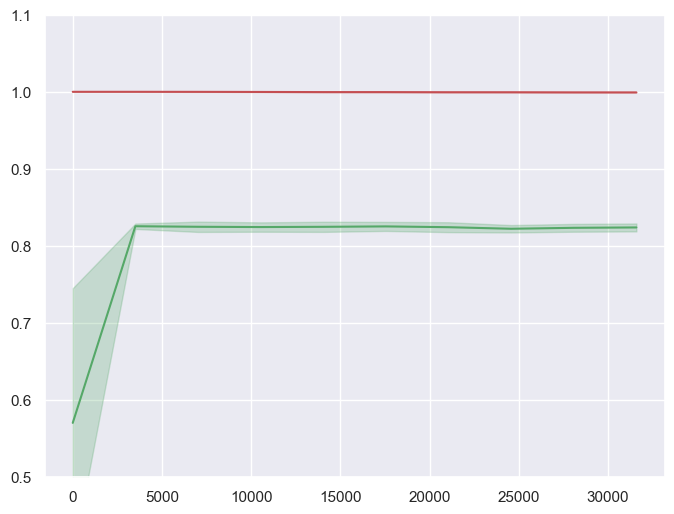

In [115]:
plt.figure(figsize = (8,6))
plt.plot(train_sizes, train_scores.mean(axis = 1), color = 'r')
plt.plot(train_sizes, valid_scores.mean(axis = 1), color = 'g')

plt.fill_between(train_sizes, train_scores.mean(axis = 1)- train_scores.std(axis = 1),
                     train_scores.mean(axis = 1)+ train_scores.std(axis = 1), alpha=0.25,
                     color="r")
plt.fill_between(train_sizes, valid_scores.mean(axis = 1) - valid_scores.std(axis = 1),
                     valid_scores.mean(axis = 1) + valid_scores.std(axis = 1), alpha=0.25, color="g")

plt.ylim(0.5,1.1)
plt.show()